## Task 3: Generative Tasks with External Models

The **third task** we defined for our **Game Recommendation Assistant** is the following:

**RAG system with Text + Image files as Input**: Given a user query about finding a specific kind of game and an image that supports that statement, the system retrieves from the vector database using similarity search based on embeddings to find the most similar game description and image to the given data. Then, the information provided by the user and the retrieved one will be passed to a customized prompt that will later be used by an external generative model we chose. The output of the model will be a game description generated based on all the information it received previously, and the image we retrieved from the vector database will be shown as an example (these are not generated by the model).

**RAG system with Text + Video files as Input**: The idea is practically identical to the former point, but here we have a video instead of an image. Due to the lack of GPU resources, we couldn't do much here. The most difficult problem here is dealing with video inputs. What we did was divide the video into different frames (images) so we could pass them all together to the model, which means we are ignoring the audio content of the video. Even then, we were only able to extract a few frames (in the end, we decided to use only 8 frames, as more than 12 could exceed the GPU resources of Kaggle) from a video to correctly execute the generative model. The output here is also a game description plus a list of images (frames of the video).

In [47]:
# Importing useful dependencies
import io
import boto3
import torch
import imageio
import cv2 # for reading video frames
import chromadb
import requests
import open_clip
import numpy as np
from PIL import Image
from io import BytesIO
import ipywidgets as widgets
from IPython.display import display
# If you are having problems importing these functions from the transformers library, try executing them on Kaggle
from transformers import AutoProcessor, LlavaOnevisionForConditionalGeneration, CLIPVisionModelWithProjection, CLIPImageProcessor

In [2]:
# Setup S3 client for MinIO (MinIO implements Amazon S3 API)
s3 = boto3.client(
    "s3",
    endpoint_url="http://127.0.0.1:9000", # MinIO API endpoint
    aws_access_key_id="minioadmin", # User name
    aws_secret_access_key="minioadmin", # Password
)

In [41]:
# Connect to the server of ChromaDB where we stored the embeddings of files (Docker Container)
client = chromadb.HttpClient(host="localhost", port=8000)

# Create or get the collection named "texts_images"
collection_texts_images = client.create_collection(name="texts_images", get_or_create=True, embedding_function=None)

# Create or get the collection named "videos"
collection_videos = client.create_collection(name="videos", get_or_create=True, embedding_function=None)

In [4]:
# Just in case our device has gpu
device = "cuda" if torch.cuda.is_available() else "cpu"

### Model configuration

The following cell is recommended to execute using the free GPU resources provided by Kaggle. Otherwise, it's highly possible to experience a kernel crash.

In [ ]:
# We will use this model as the answerer of our RAG system.
model_id = "llava-hf/llava-onevision-qwen2-0.5b-ov-hf"

# Load model + processor
model = LlavaOnevisionForConditionalGeneration.from_pretrained(
    model_id,
    dtype=torch.float16,
    low_cpu_mem_usage=True,
).to(device)
processor = AutoProcessor.from_pretrained(model_id)

`torch_dtype` is deprecated! Use `dtype` instead!


config.json: 0.00B [00:00, ?B/s]

C:\Users\SakuraSnow\AppData\Local\Programs\Python\Python311\Lib\site-packages\huggingface_hub\file_download.py:143: UserWarning: `huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in C:\Users\SakuraSnow\.cache\huggingface\hub\models--llava-hf--llava-onevision-qwen2-0.5b-ov-hf. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python as an administrator. In order to activate developer mode, see this article: https://docs.microsoft.com/en-us/windows/apps/get-started/enable-your-device-for-development
  warnings.warn(message)
Xet Storage is enabled for this repo, but the 'hf_xet' package

model.safetensors:   0%|          | 0.00/1.79G [00:00<?, ?B/s]

### Text + Image Inputs

In [11]:
# Load "ViT-B-16" model for images and texts
model_it, _, preprocess_it = open_clip.create_model_and_transforms("ViT-B-16", pretrained="openai")
tokenizer_it = open_clip.get_tokenizer("ViT-B-16") # Tokenizer for texts
model_it.to(device)

C:\Users\SakuraSnow\AppData\Local\Programs\Python\Python311\Lib\site-packages\open_clip\factory.py:450: UserWarning: QuickGELU mismatch between final model config (quick_gelu=False) and pretrained tag 'openai' (quick_gelu=True).
  warnings.warn(


CLIP(
  (visual): VisionTransformer(
    (conv1): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16), bias=False)
    (patch_dropout): Identity()
    (ln_pre): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
    (transformer): Transformer(
      (resblocks): ModuleList(
        (0-11): 12 x ResidualAttentionBlock(
          (ln_1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
          (attn): MultiheadAttention(
            (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
          )
          (ls_1): Identity()
          (ln_2): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
          (mlp): Sequential(
            (c_fc): Linear(in_features=768, out_features=3072, bias=True)
            (gelu): GELU(approximate='none')
            (c_proj): Linear(in_features=3072, out_features=768, bias=True)
          )
          (ls_2): Identity()
        )
      )
    )
    (ln_post): LayerNorm((768,), eps=1e-05, elementwise_affine

In [13]:
# Function to perform the similarity search
def find_similar_files(collection, query_emb: np.ndarray, top_k: int = 5):
    
    # Chroma expects list-of-lists for query_embeddings
    query_vector = query_emb.tolist()

    results = collection.query(
        query_embeddings=[query_vector],
        n_results=top_k,
        include=["documents", "distances"]
    )

    # Extract first query results
    ids = results.get("ids", [[]])[0]
    docs = results.get("documents", [[]])[0]
    dists = results.get("distances", [[]])[0]

    print(f"Top {top_k} similar {collection.name}:")
    for rank, (doc_id, doc, dist) in enumerate(zip(ids, docs, dists), start=1):
        print(f"{rank}. id={doc_id}, distance={dist:.4f}")
        print(f"   document: {doc}")
        temp_path = doc.split("/")[-1]
        if (collection.name == "images"):
            display(get_image("trusted-zone", f"{collection.name}/{temp_path}"))
        elif (collection.name == "texts"):
            print("\n" + get_text("trusted-zone", f"{collection.name}/{temp_path}") + "\n")
        elif (collection.name == "videos"):
            frames = get_video("trusted-zone", f"{collection.name}/{temp_path}")
            for frame in frames:
                display(frame)
    return results

**User Inputs**

In [5]:
# Let's define a user query for our RAG system
user_query = (
    "Please recommend me a game similar to the one shown in the image."
) # This do not provide any useful information for retrieving similar textual embeddings, it's too vague

In [10]:
# Here is another query that provides more insights into the problem
user_query_ex = (
    "Please recommend me an open-world action RPG game with exploration similar to the one shown in the image."
) # This query does provide information about the type of game we are looking for

In [7]:
# This is the image provided by the user
uploader = widgets.FileUpload(accept='image/*', multiple=False)
display(uploader) # Load an image first before executing the upcoming cells

FileUpload(value=(), accept='image/*', description='Upload')

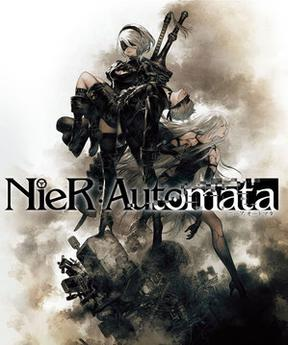

In [9]:
# Extract the uploaded file
user_image = uploader.value[0].content
user_image = Image.open(BytesIO(user_image))
user_image

**System Inputs**

In [34]:
# We can use this function to retrieve an text from our bucket
def get_text(bucket, key):
    resp = s3.get_object(Bucket=bucket, Key=key)
    body = resp["Body"].read()
    text = body.decode("utf-8")
    return text

@torch.no_grad()
# The next function returns the embedding of the given text
def embed_text(model, tokenizer, texts: str):
    tokens = tokenizer([texts]).to(device) # tokenized batch
    feats = model.encode_text(tokens)
    feats = feats / feats.norm(dim=-1, keepdim=True) # normalize
    return feats.cpu().numpy()[0]

# Retrieve from our vector database the most similar description by using the user queries
query_emb_1 = embed_text(model_it, tokenizer_it, user_query)
# Search for similar texts in ChromaDB
res_text_1 = find_similar_files(collection_texts_images, query_emb_1, top_k=1) # For efficiency, we will always choose the first option
# The collection we are using has also embeddings of images, however, the most similar files will always be that of the same modality

# Get retrieved description
retrieved_des_1 = get_text("trusted-zone", "texts/" + res_text_1['documents'][0][0].split("/")[-1])
retrieved_des_1

Top 1 similar texts_images:
1. id=text_172, distance=0.2274
   document: trusted-zone/texts/text_1760786418510.txt


'先声明本游戏战斗有一定难度，并不适合喜欢玩挂机刷刷刷的朋友。 由于并没有太多的测试人员，主要是我自己在测试，即便我玩了很多遍，但难免会有遗漏和不合理的地方。 如果有出现BUG或者大家觉得有某些地方难度不合理，希望大家能积极反馈，评论区留言或者进群@都行！感谢各位赏脸游玩！ 游戏着有不同于其他回合制游戏的战斗机制，每个角色有着独特且能产生质变的天赋加点，你可以把角色按你想的方向上培养。 但是注意你的天赋需要与你主要使用的技能搭配，才能发挥最大效果。 本游戏需要注意的点： 1.很多技能释放需要tp点，我们可以通过加攻速或者加tp回复来提高tp获取效率。 2.技能每次使用会获得熟练度，熟练度可以提升技能等级和伤害，技能熟练度达到要求会解锁更高级技能，所以我们要尽可能多的使用技能，把一个技能练到极致会比每个技能练一会要强得多！ 3.游戏的里控制技能对任何敌人都有效，但部分怪物被控制后会狂暴，狂暴状态下将免疫控制且伤害可能会略微提高。 4.按Q可以快捷保存。 5.设置里面有设置战斗加速，修改窗口样式等功能。 6.更换装备时镶嵌物品会自动转移到新装备上，不需要自己取下来重新镶嵌。 关于战斗： 与其他回合制战斗不同，游戏中有攻速属性。 攻速直接影响角色普通攻击造成伤害的次数，而普通攻击每次造成伤害恢复5点TP，物理系技能是没有冷却时间的只受TP点数的限制，所以攻速也间接的影响了技能的释放频率。 对于敏捷路线的角色，想要提升输出，提升敏捷和攻速是最佳方式。（前提是你的攻击不能太低） 对于力量和智力路线的角色，攻速带来的提升并不明显，所以TP恢复至关重要。很多时候直接增加伤害不如增加TP恢复来的实在！ 关于美术： 刚开始是有想请画师和美工的打算，可是了解了下价格我放弃了…… 整个游戏包括角色立绘、行走图、怪物图片、场景图块、技能特效、UI设计然后一堆图标感觉没个十来万下不来，这让我实在承受不住。 后来想找人已合作的方式给分成，但似乎也不现实，毕竟想找人来免费玩你的游戏都挺困难的…… 所以，只能咬咬牙自己瞎折腾了。游戏的UI素材大部分是RPG make和dlc自带的，也使用了部分其他资源，费劲力气也只能整成现在这样了！ 关于剧情： 作为一个rpg游戏剧情至关重要，但是很遗憾…… 我个人觉得游戏的剧情框架还是不错的，但是受限于自己的文笔和图片素材不足，很多剧情其实都是根据现有图片素材临

In [33]:
# We can also have a comparison between "user_query" and "user_query_ex"
query_emb_2 = embed_text(model_it, tokenizer_it, user_query_ex)
res_text_2 = find_similar_files(collection_texts_images, query_emb_2, top_k=1)

# Get retrieved description
retrieved_des_2 = get_text("trusted-zone", "texts/" + res_text_2['documents'][0][0].split("/")[-1])
retrieved_des_2
# It seems like the sencond query leads to a better description, so in the following cells we will use this query

Top 1 similar texts_images:
1. id=text_351, distance=0.3126
   document: trusted-zone/texts/text_1760786434970.txt


"Guys, it's a very difficult game. VERY difficult. Before you buy it, you should ask yourself: 'Am I a fan of hardcore platformers?' If the answer is yes, then you may like it. You'll be dying a lot, but checkpoints are frequent. The game is difficult for its challenges, not because you have to repeat long sections from the beginning. If you have any questions, you can text me in Discord. You found yourself in the twisted world with the only 'person' to rely on is the strange thing stuck on your hand who seems to know more than he tells. Reveal the mystery of this whole place and find your way out in this brutal action platformer. Features: +10 long levels filled with difficult platforming and over 30 types of merciless enemies +A boss awaits you at the end of each level +12 different weapons +Acrobatic moves of our heroine allow you to slide, double jump, wall jump, dash through enemy attacks and grapple to certain objects +Multiple endings that depend on your choices as you progress 

Top 1 similar texts_images:
1. id=img_774, distance=0.5525
   document: trusted-zone/images/image_1760786367554.png


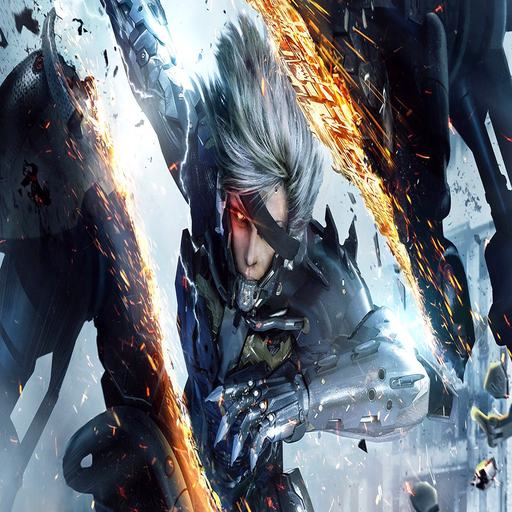

In [36]:
# We can use this function to retrieve an image from our bucket in PIL Image format
def get_image(bucket, key):
    resp = s3.get_object(Bucket=bucket, Key=key)
    body = resp["Body"].read()
    img = Image.open(io.BytesIO(body))
    return img

# The next function returns the embedding of the given PIL Image
def embed_image(preprocess, model, pil_img):
    img_tensor = preprocess(pil_img).unsqueeze(0).to(device)
    with torch.no_grad():
        feats = model.encode_image(img_tensor)
    feats = feats / feats.norm(dim=-1, keepdim=True)
    return feats.cpu().numpy().squeeze()

# Compute the embeddings of the user image
user_image_emb = embed_image(preprocess_it, model_it, user_image)
# Retrived similar image
res_image = find_similar_files(collection_texts_images, user_image_emb, top_k=1)

# Get retrieved image
retrieved_image = get_image("trusted-zone", "images/" + res_image['documents'][0][0].split("/")[-1])
retrieved_image

**Recommending Games**

In [38]:
def get_multimodal_prompt(description, user_query):
    multimodal_prompt = [
        {
            "role": "system",
            "content": [
                {"type": "text", "text": "You are a Game Recommendation Assistant, an expert in games."},
                {"type": "text", "text": "The user will ask you to recommend a game based on the user's request and an image."},
                {"type": "text", "text": "Your task is to generate a game description of similar type."},
                {"type": "text", "text": "You can use the following description and image as examples:"},
                {"type": "text", "text": description},
                {"type": "image"}, # <- first placeholder for images
            ],
        },
        {
            "role": "user",
            "content": [
                {"type": "text", "text": f"Generate a game description based on this request:\n{user_query}"},
                {"type": "image"} # <- second placeholder for images
            ],
        },
    ]

    return multimodal_prompt

# Get multimodal_prompt
multimodal_prompt = get_multimodal_prompt(retrieved_des_2, user_query_ex) # <- include the retrieved description and user query here

Setting `pad_token_id` to `eos_token_id`:151645 for open-end generation.



🎮 Model Recommendation:
The game you're referring to is "Nier: Automata," which is a dark fantasy RPG with a dark and gritty atmosphere. It features a protagonist named Nier, who is a cyborg with the ability to control and manipulate automata. The game is set in a post-apocalyptic world where Nier must navigate through treacherous landscapes, battle against other cyborgs, and uncover the secrets of the automata. The game is known for its atmospheric sound design and its exploration of themes such as identity, morality, and the nature of humanity.

Here you have an image of the game: 


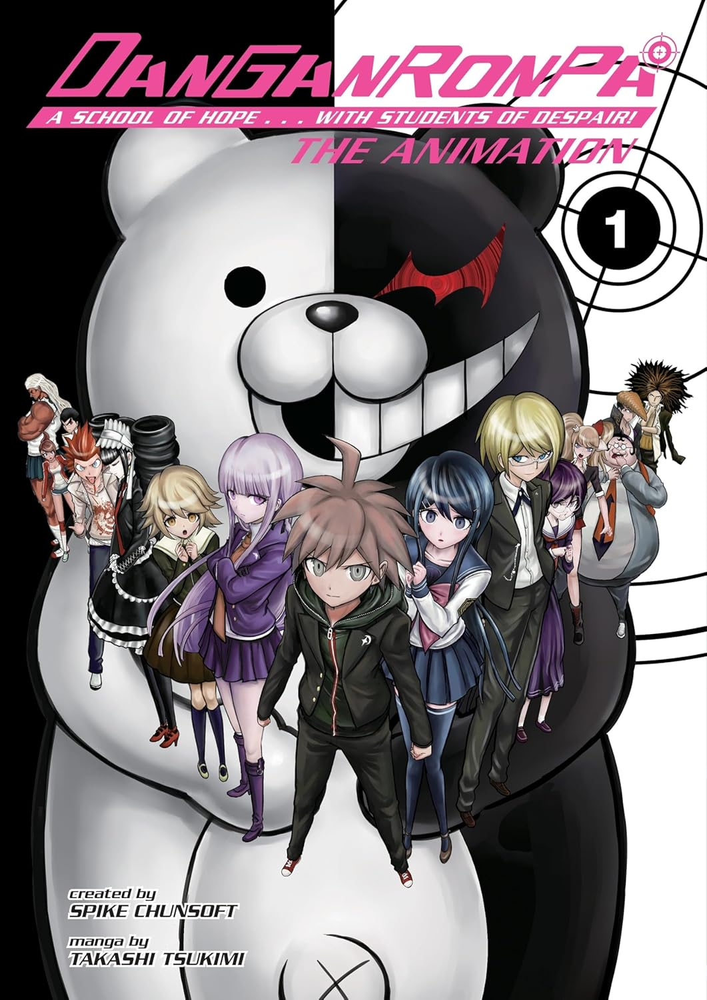

In [13]:
# Image list to feed the processor of the model
images_list = [retrieved_image, user_image] # The first image corresponds to the retrieved one, the second is the user's

# Apply template
prompt = processor.apply_chat_template(multimodal_prompt, add_generation_prompt=True)

# Prepare inputs
inputs = processor(
    text=prompt,
    images=images_list, # must match number of placeholders
    return_tensors="pt"
).to(device, torch.float16)

# Generate answer and decode
output = model.generate(**inputs, max_new_tokens=200, do_sample=False)
decoded = processor.decode(output[0], skip_special_tokens=True)

# Clean out possible prompt leftovers like "assistant" or special tokens
clean_output = decoded.split("assistant\n")[-1].strip()
clean_output = clean_output.replace(processor.image_token, "").strip()

print("\n🎮 Model Recommendation:")
print(clean_output)
print("\nHere you have an image of the game: ")
display(retrieved_image) # The result might not be good, since we may not have that image in the database

### Text + Video Inputs

**User Inputs**

In [51]:
# New user query
user_query_v_ex = (
    "Please recommend me an open-world action RPG game with exploration similar to the one shown in the video."
) # This query does provide information about the type of game we are looking for

In [40]:
# In this case, it similar to using images. Here we use a list of images, the frames of a video.
# This is done since LlaVa models does not treat videos as an audiovisual experience, it does not take into account audio content of videos.

# First we need to extract frames from the video (using all frames might be too much for the model we are using)
def extract_video_frames(video_path, interval=1.0):
    """Extract one frame every `interval` seconds as PIL images."""
    cap = cv2.VideoCapture(video_path)
    fps = cap.get(cv2.CAP_PROP_FPS) or 30 # default to 30 if unknown
    step = int(fps * interval)
    total = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    frames = []

    for i in range(0, total, step):
        cap.set(cv2.CAP_PROP_POS_FRAMES, i)
        ok, frame = cap.read()
        if not ok:
            break
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        frames.append(Image.fromarray(frame))

    cap.release()
    return frames

# Imagine here we have a video provided by the user
video_path = "https://cdn.akamai.steamstatic.com/steam/apps/256863704/movie_max.mp4?t=1638854607"
user_frames = extract_video_frames(video_path, interval=15.0) # 1 frame every 15 seconds -> we do not enough gpu resources to run a long list of images
print(f"Extracted {len(user_frames)} frames")

Extracted 8 frames


In [44]:
# Load the model used to create embeddings of videos to create embeddings of the user video

# Load model + preprocessing used when creating the video embeddings
tokenizer_video = CLIPImageProcessor.from_pretrained("Searchium-ai/clip4clip-webvid150k")
model_video = CLIPVisionModelWithProjection.from_pretrained("Searchium-ai/clip4clip-webvid150k")
model_video.to(device)

CLIPVisionModelWithProjection(
  (vision_model): CLIPVisionTransformer(
    (embeddings): CLIPVisionEmbeddings(
      (patch_embedding): Conv2d(3, 768, kernel_size=(32, 32), stride=(32, 32), bias=False)
      (position_embedding): Embedding(50, 768)
    )
    (pre_layrnorm): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
    (encoder): CLIPEncoder(
      (layers): ModuleList(
        (0-11): 12 x CLIPEncoderLayer(
          (self_attn): CLIPAttention(
            (k_proj): Linear(in_features=768, out_features=768, bias=True)
            (v_proj): Linear(in_features=768, out_features=768, bias=True)
            (q_proj): Linear(in_features=768, out_features=768, bias=True)
            (out_proj): Linear(in_features=768, out_features=768, bias=True)
          )
          (layer_norm1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
          (mlp): CLIPMLP(
            (activation_fn): QuickGELUActivation()
            (fc1): Linear(in_features=768, out_features=3072, bias=

**System Video**

In [53]:
query_emb_3 = embed_text(model_it, tokenizer_it, user_query_v_ex)
res_text_3 = find_similar_files(collection_texts_images, query_emb_3, top_k=1)

# Get retrieved description
retrieved_des_3 = get_text("trusted-zone", "texts/" + res_text_3['documents'][0][0].split("/")[-1])
retrieved_des_3 # Not very different from the previous one, since we only changed a word (image -> video).

Top 1 similar texts_images:
1. id=text_351, distance=0.2941
   document: trusted-zone/texts/text_1760786434970.txt


"Guys, it's a very difficult game. VERY difficult. Before you buy it, you should ask yourself: 'Am I a fan of hardcore platformers?' If the answer is yes, then you may like it. You'll be dying a lot, but checkpoints are frequent. The game is difficult for its challenges, not because you have to repeat long sections from the beginning. If you have any questions, you can text me in Discord. You found yourself in the twisted world with the only 'person' to rely on is the strange thing stuck on your hand who seems to know more than he tells. Reveal the mystery of this whole place and find your way out in this brutal action platformer. Features: +10 long levels filled with difficult platforming and over 30 types of merciless enemies +A boss awaits you at the end of each level +12 different weapons +Acrobatic moves of our heroine allow you to slide, double jump, wall jump, dash through enemy attacks and grapple to certain objects +Multiple endings that depend on your choices as you progress 

Top 1 similar videos:
1. id=vid_1, distance=119.1437
   document: trusted-zone/videos/video_1760786503181.mp4


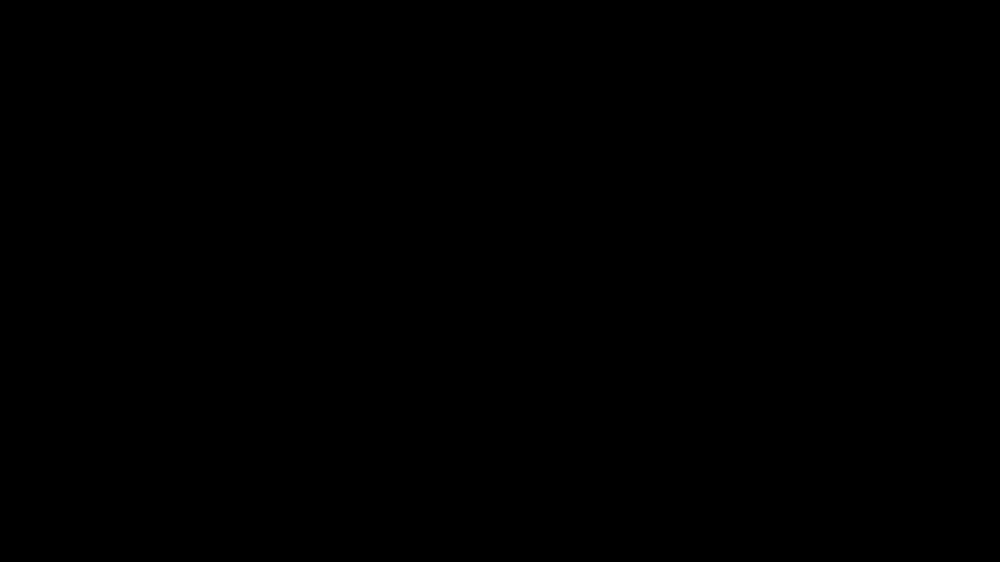

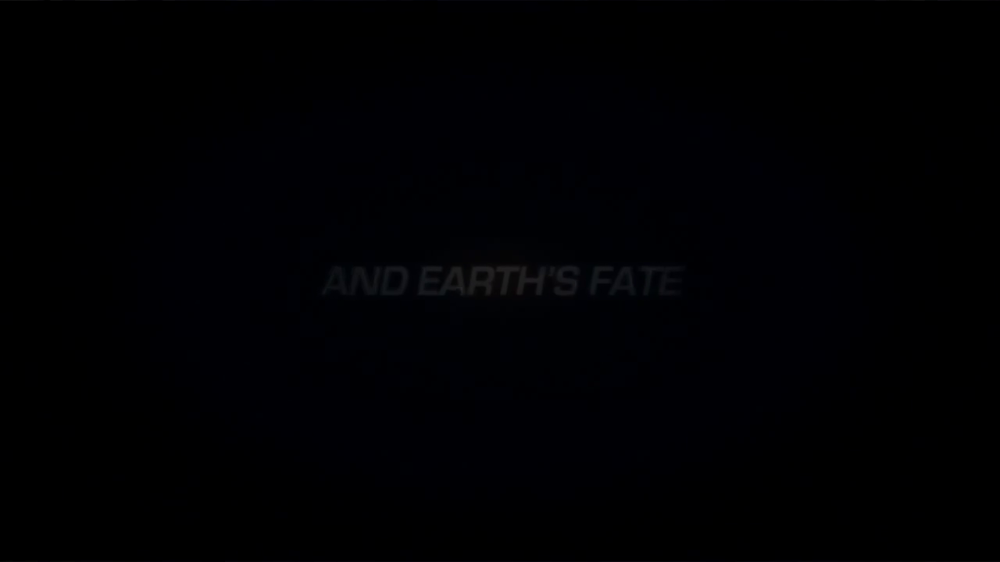

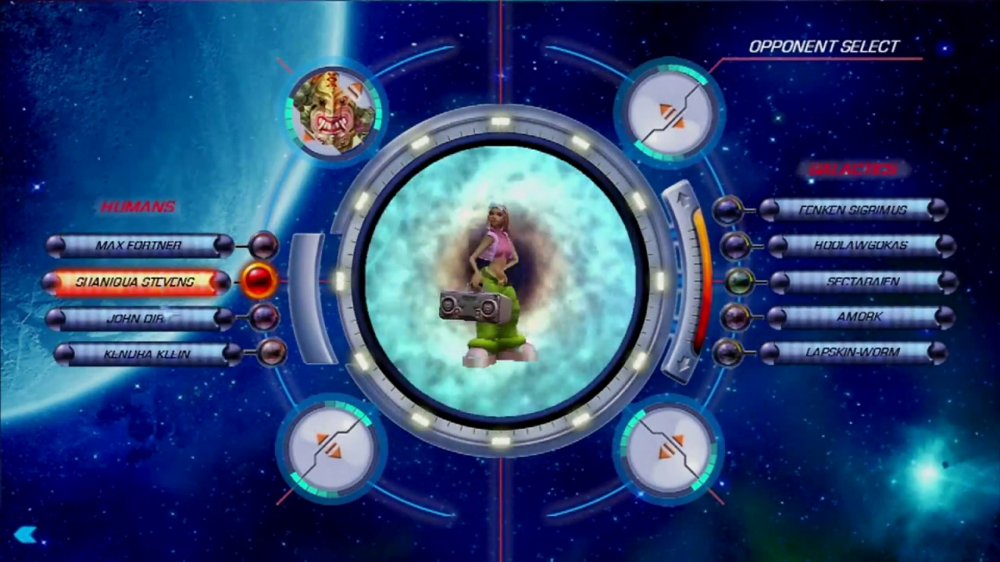

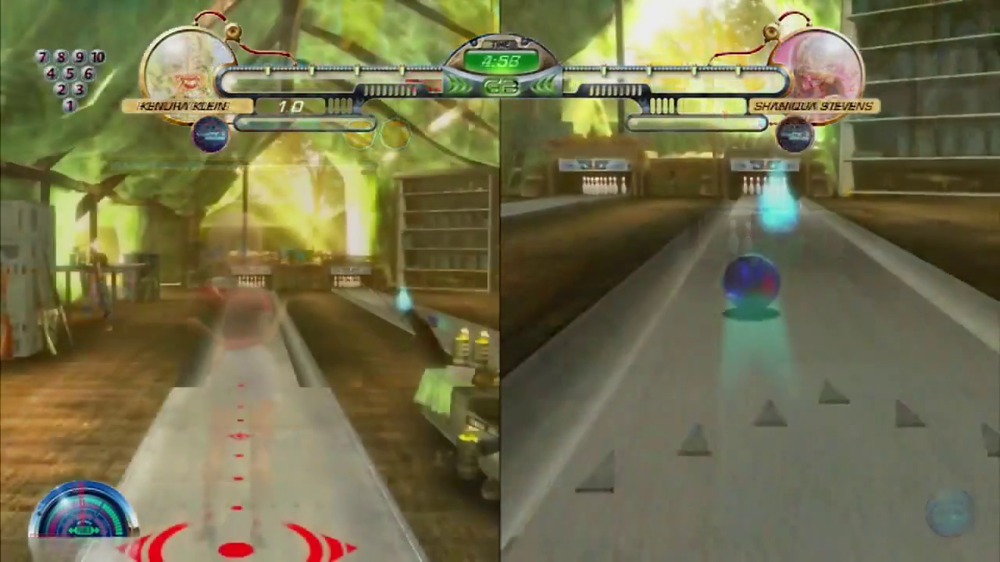

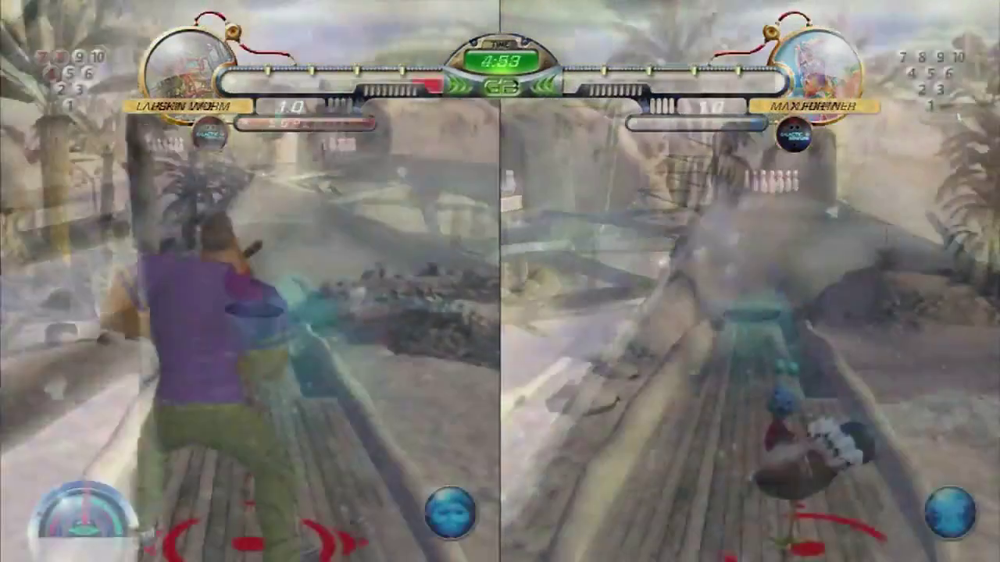

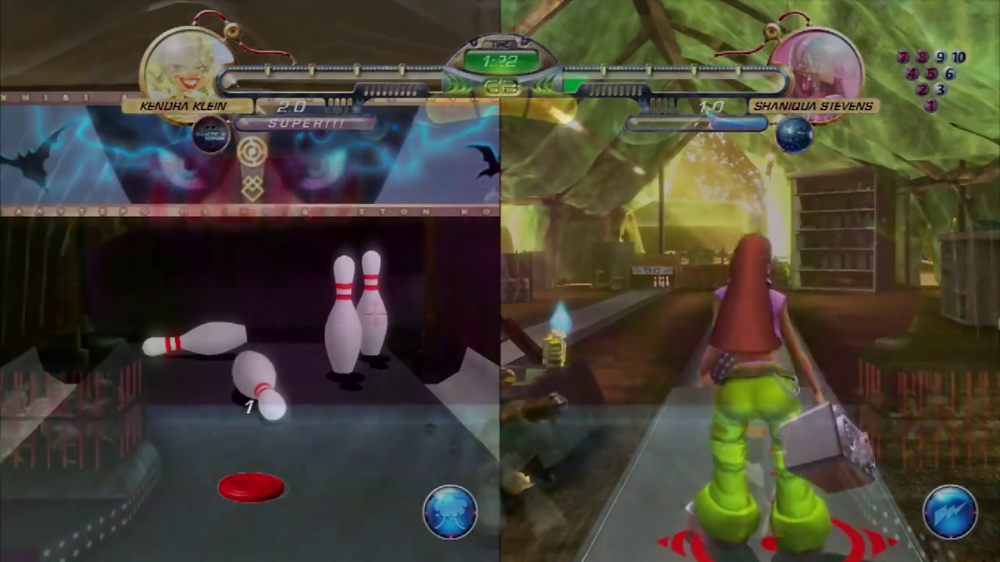

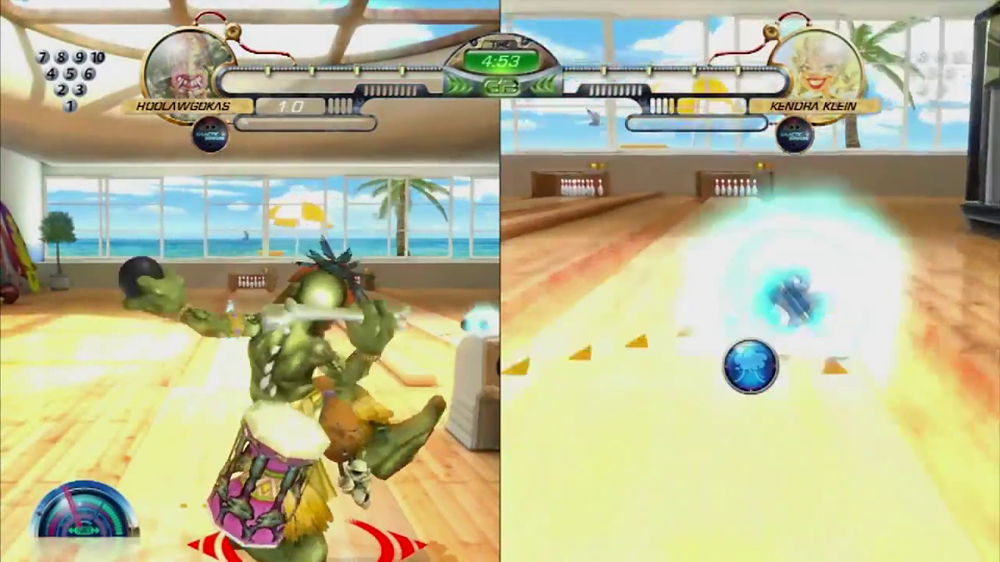

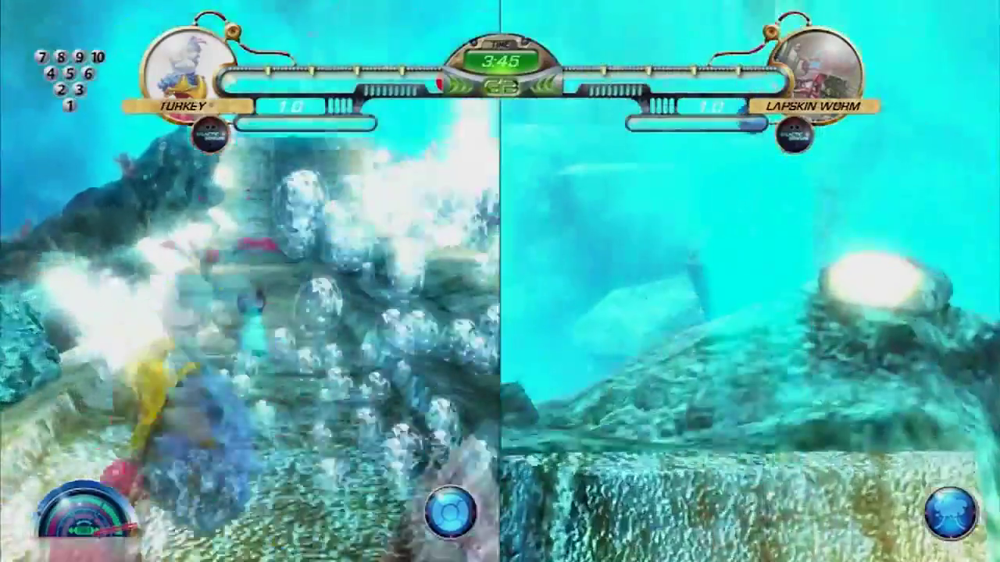

In [60]:
temp_file = "temp_video_in.mp4"
# We can use the following function to retrieve a video from our MinIO database
# We are only extracting frames of the video, ignoring the audio content of the video
def get_video(bucket = None, key = None, max_frames = 8, url = None):
    if url:
        r = requests.get(url, stream=True)
        r.raise_for_status()
        with open(temp_file, "wb") as f:
            f.write(r.content)
    else:
        resp = s3.get_object(Bucket=bucket, Key=key)
        body = resp["Body"].read()
        with open(temp_file, "wb") as f:
            f.write(body)
    frames = []
    reader = imageio.get_reader(temp_file, format="ffmpeg")
    total_frames = reader.count_frames()
    if total_frames and total_frames > 0:
        step = max(1, total_frames // max_frames)
        #print(total_frames, step, max_frames)
        idxs = list(range(0, total_frames, step))[:max_frames]
        for i in idxs:
            try:
                frame = reader.get_data(i)
                frames.append(Image.fromarray(frame))
            except Exception:
                continue
    else:
        # fallback: iterate and collect up to max_frames
        for i, frame in enumerate(reader):
            frames.append(Image.fromarray(frame))
            if len(frames) >= max_frames:
                break
    reader.close()
    return frames

# The next function returns the embedding of the given video
def embed_video(tokenizer, model, frames_video):
    inputs = tokenizer(images=frames_video, return_tensors="pt")
    pixel_values = inputs["pixel_values"].to(device) # shape (num_frames, 3, H, W)

    with torch.no_grad():
        outputs = model(pixel_values=pixel_values)
        # prefer pooler_output if available, else mean over last_hidden_state
        emb_frames = getattr(outputs, "pooler_output", None)
        if emb_frames is None:
            emb_frames = outputs.last_hidden_state.mean(dim=1)
        # average frame embeddings to make video embedding
        video_emb = emb_frames.mean(dim=0).cpu().numpy()
    return  video_emb

# Create embeddings for the user video
frames_emb = embed_video(tokenizer_video, model_video, user_frames)
# Search for the most similar video in ChromaDB
res_video = find_similar_files(collection_videos, frames_emb, top_k=1)

# Get retrieved video frames
retrieved_frames = get_video("trusted-zone", "videos/" + res_video['documents'][0][0].split("/")[-1])

**Recommending Games**

In [61]:
def get_multimodal_prompt_videos(description, user_query):
    multimodal_prompt = [
        {
            "role": "system",
            "content": [
                {"type": "text", "text": "You are a Game Recommendation Assistant, an expert in games."},
                {"type": "text", "text": "The user will ask you to recommend a game based on a textual description and a list of in-game images."},
                {"type": "text", "text": "Your task is to generate a game description of similar type."},
                {"type": "text", "text": "You can use the following description and images as examples:"},
                {"type": "text", "text": description},
                {"type": "video1"}, # <- first placeholder for images
            ],
        },
        {
            "role": "user",
            "content": [
                {"type": "text", "text": f"Generate a game description based on this request:\n{user_query}"},
                {"type": "video2"} # <- second placeholder for images
            ],
        },
    ]

    return multimodal_prompt

# Get multimodal_prompt
multimodal_prompt_v = get_multimodal_prompt_videos(retrieved_des_3, user_query_v_ex) # <- include the retrieved description and user query here

In [62]:
# Create as many image placeholders as the number of frames 
def expand_video_placeholders(prompt, frames_per_video, placeholder="video1"):
    """
    Replace every {"type":"video"} entry with frames_per_video many {"type":"image"} placeholders.
    Returns new_prompt and the count of image placeholders produced by expansion.
    """
    new_prompt = []
    for turn in prompt:
        new_turn = {"role": turn["role"], "content": []}
        for item in turn.get("content", []):
            if item.get("type") == placeholder:
                # replace with N image placeholders
                for _ in range(len(frames_per_video)):
                    new_turn["content"].append({"type":"image"})
            else:
                new_turn["content"].append(item)
        new_prompt.append(new_turn)
    return new_prompt

# Expand the prompt:
video_prompt = expand_video_placeholders(multimodal_prompt_v, retrieved_frames) # <- Video frames of the retrieved video
video_prompt = expand_video_placeholders(video_prompt, user_frames, placeholder = "video2") # Video frames of the user video

Token indices sequence length is longer than the specified maximum sequence length for this model (95627 > 32768). Running this sequence through the model will result in indexing errors
Setting `pad_token_id` to `eos_token_id`:151645 for open-end generation.



🎮 Model Recommendation:
The game you're looking for is "Bowling: The Ultimate Challenge". It's a 2D fighting game where you take on the role of a skilled bowler. The objective is to knock down the opponent's ball and score points. The game features a variety of characters, each with their own unique abilities and skills. The game is designed to be challenging yet fun, with a focus on strategy and skill.

Here you have a video (list of selected frames) of the game: 


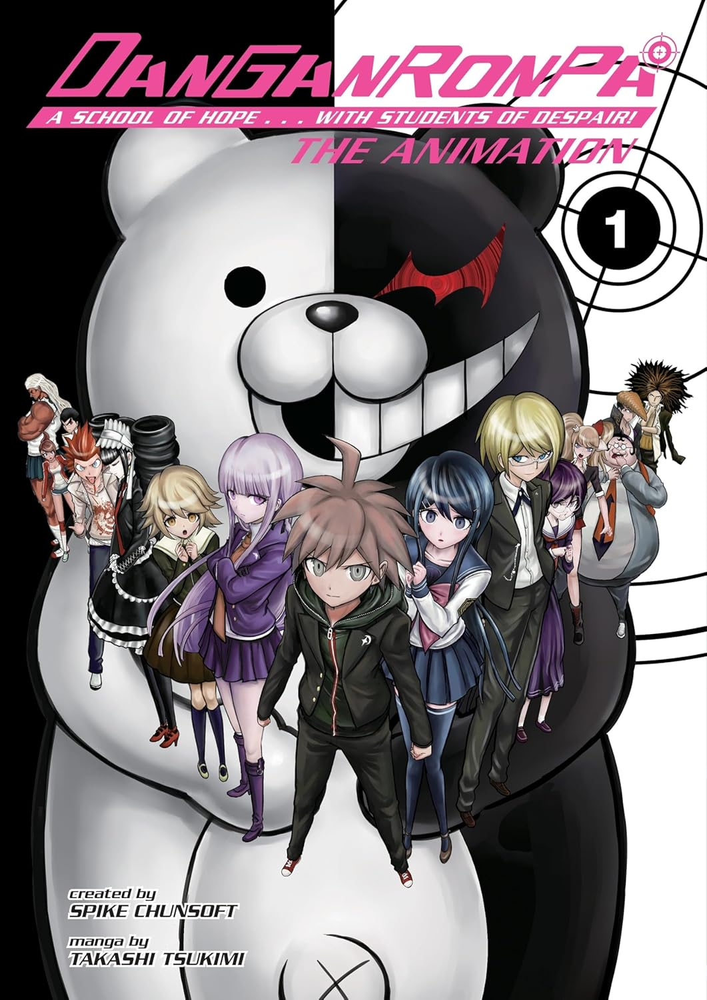

In [19]:
# List of images (frames from both videos)
images_list = retrieved_frames + user_frames

# Use the expanded prompt and images with the processor
prompt = processor.apply_chat_template(video_prompt, add_generation_prompt=True)

# Prepare inputs
inputs = processor(
    text=prompt,
    images=images_list, # must match number of placeholders
    return_tensors="pt"
).to(device, torch.float16)

# Generate
output = model.generate(**inputs, max_new_tokens=200, do_sample=False)
decoded = processor.decode(output[0], skip_special_tokens=True)

# Clean out possible prompt leftovers like "assistant" or special tokens
clean_output = decoded.split("assistant\n")[-1].strip()
clean_output = clean_output.replace(processor.image_token, "").strip()

print("\n🎮 Model Recommendation:")
print(clean_output)
print("\nHere you have a video (list of selected frames) of the game: ")
for frame in retrieved_frames:
    display(frame) # Retrieved one